<a href="https://colab.research.google.com/github/nidhishtk/Assignment_06_Logistic-Regression/blob/main/Q1_Bank.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Prepare a prediction model for whether the client has subscribed a term deposit or not.

## Attaching Resources

### Importing Necessary Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as pe
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import roc_auc_score, roc_curve, accuracy_score
from sklearn.preprocessing import binarize
import warnings

warnings.filterwarnings('ignore')
plt.rcParams['figure.figsize'] = (20, 15)
plt.rcParams['figure.dpi'] = 350
sns.set_style(style='darkgrid')
plt.tight_layout()


<Figure size 7000x5250 with 0 Axes>

### Adding Dataset

In [2]:
from google.colab import files
bk = files.upload()

bk = pd.read_csv('bank-full.csv', sep=";")

bk


Saving bank-full.csv to bank-full.csv


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


In [4]:
bk_nrow = bk.shape[0]


In [5]:
def lost_record():

    bk_nrow_now = bk.shape[0]
    lost = bk_nrow - bk_nrow_now
    lost = (lost/bk_nrow)*100
    lost = round(lost, 2)

    return print('We lost ' + str(lost) + ' % data')


## Performing EDA In Dataset

### Applying Descriptive Statistics

In [6]:
bk.describe()


,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


In [7]:
bk.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [8]:
bk.isna().sum()


age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64

In [9]:
def uni(df):

    for i in range(len(df.columns)):
        print('\n All Unique Value in ' + str(df.columns[i]))
        print(np.sort(df[df.columns[i]].unique()))
        print('Total no of unique values ' +
              str(len(df[df.columns[i]].unique())))


In [10]:
uni(bk)



 All Unique Value in age
[18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41
 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65
 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89
 90 92 93 94 95]
Total no of unique values 77

 All Unique Value in job
['admin.' 'blue-collar' 'entrepreneur' 'housemaid' 'management' 'retired'
 'self-employed' 'services' 'student' 'technician' 'unemployed' 'unknown']
Total no of unique values 12

 All Unique Value in marital
['divorced' 'married' 'single']
Total no of unique values 3

 All Unique Value in education
['primary' 'secondary' 'tertiary' 'unknown']
Total no of unique values 4

 All Unique Value in default
['no' 'yes']
Total no of unique values 2

 All Unique Value in balance
[ -8019  -6847  -4057 ...  81204  98417 102127]
Total no of unique values 7168

 All Unique Value in housing
['no' 'yes']
Total no of unique values 2

 All Unique Value in loan
['no' 'yes']
Total no of unique 

### Checking for Duplicated Values

In [11]:
bk[bk.duplicated()]


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y


- There is no duplicate vale in are dataset

### Visualizing The Data

<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

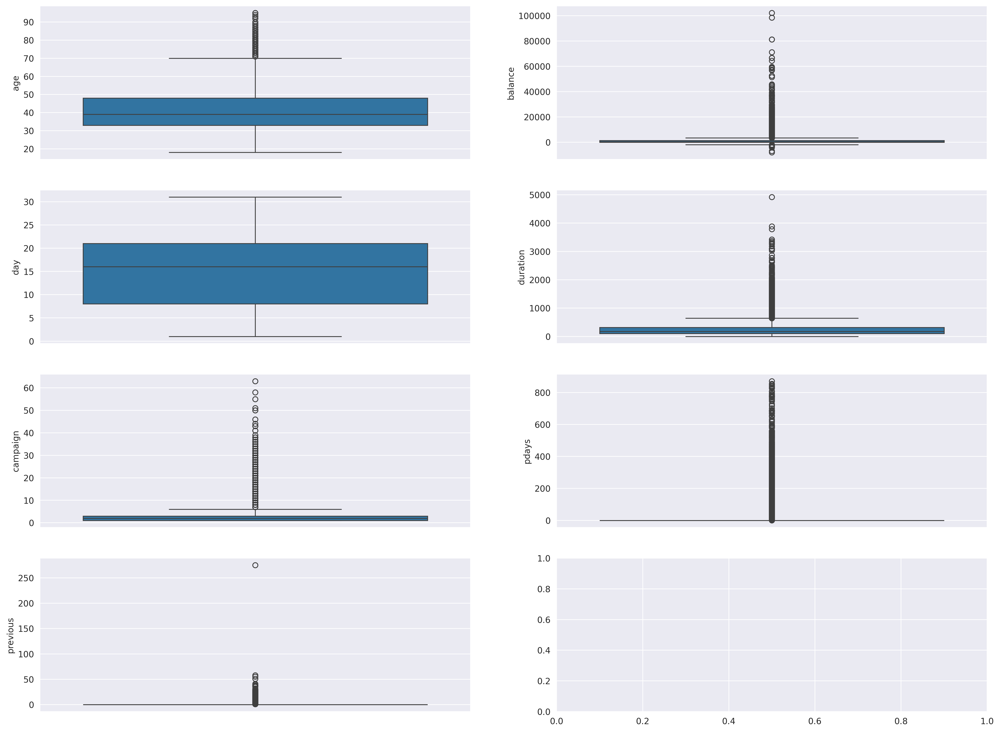

In [12]:
fig, ax = plt.subplots(4, 2)

sns.boxplot(bk['age'], ax=ax[0, 0])
sns.boxplot(bk['balance'], ax=ax[0, 1])
sns.boxplot(bk['day'], ax=ax[1, 0])
sns.boxplot(bk['duration'], ax=ax[1, 1])
sns.boxplot(bk['campaign'], ax=ax[2, 0])
sns.boxplot(bk['pdays'], ax=ax[2, 1])
sns.boxplot(bk['previous'], ax=ax[3, 0])

plt.tight_layout


<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

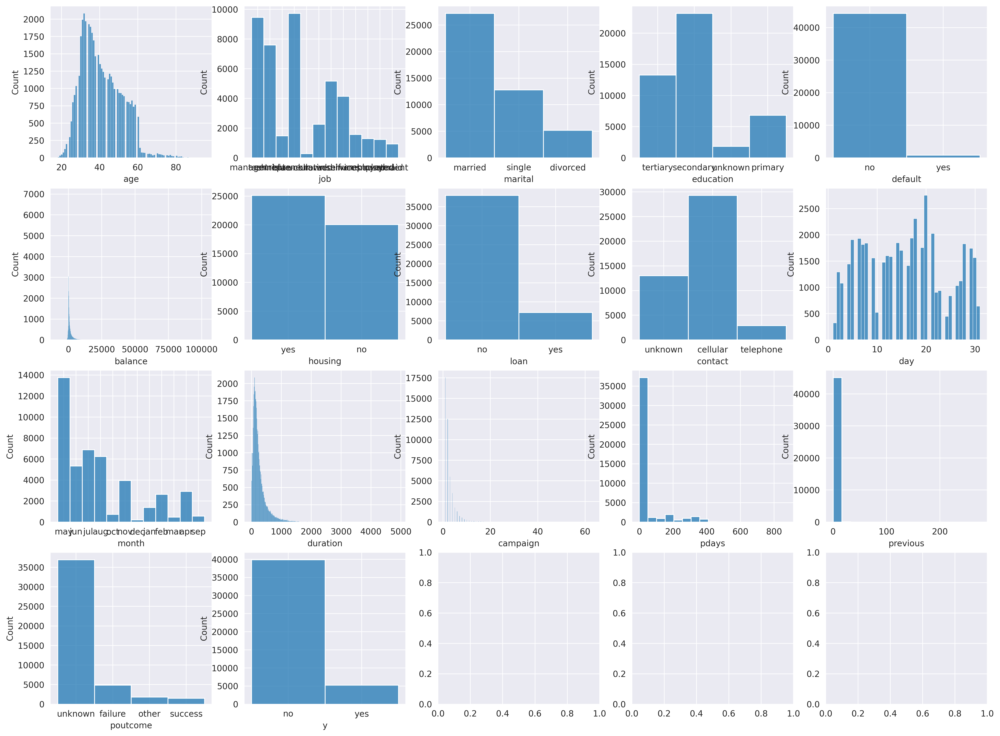

In [13]:
fig, ax = plt.subplots(4, 5)

sns.histplot(bk['age'], ax=ax[0, 0])
sns.histplot(bk['job'], ax=ax[0, 1])
sns.histplot(bk['marital'], ax=ax[0, 2])
sns.histplot(bk['education'], ax=ax[0, 3])
sns.histplot(bk['default'], ax=ax[0, 4])
sns.histplot(bk['balance'], ax=ax[1, 0])
sns.histplot(bk['housing'], ax=ax[1, 1])
sns.histplot(bk['loan'], ax=ax[1, 2])
sns.histplot(bk['contact'], ax=ax[1, 3])
sns.histplot(bk['day'], ax=ax[1, 4])
sns.histplot(bk['month'], ax=ax[2, 0])
sns.histplot(bk['duration'], ax=ax[2, 1])
sns.histplot(bk['campaign'], ax=ax[2, 2])
sns.histplot(bk['pdays'], ax=ax[2, 3])
sns.histplot(bk['previous'], ax=ax[2, 4])
sns.histplot(bk['poutcome'], ax=ax[3, 0])
sns.histplot(bk['y'], ax=ax[3, 1])
plt.tight_layout


<function matplotlib.pyplot.tight_layout(*, pad=1.08, h_pad=None, w_pad=None, rect=None)>

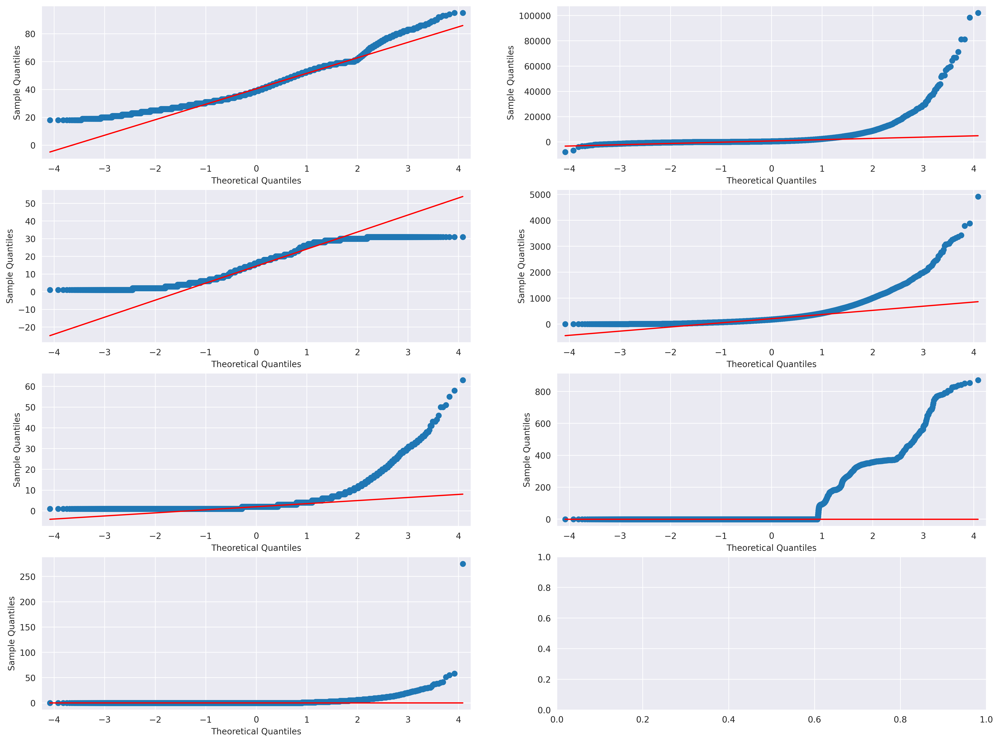

In [14]:
fig, ax = plt.subplots(4, 2)

sm.qqplot(bk['age'], ax=ax[0, 0], line='q')
sm.qqplot(bk['balance'], ax=ax[0, 1], line='q')
sm.qqplot(bk['day'], ax=ax[1, 0], line='q')
sm.qqplot(bk['duration'], ax=ax[1, 1], line='q')
sm.qqplot(bk['campaign'], ax=ax[2, 0], line='q')
sm.qqplot(bk['pdays'], ax=ax[2, 1], line='q')
sm.qqplot(bk['previous'], ax=ax[3, 0], line='q')

plt.tight_layout


### Correlation Analysis

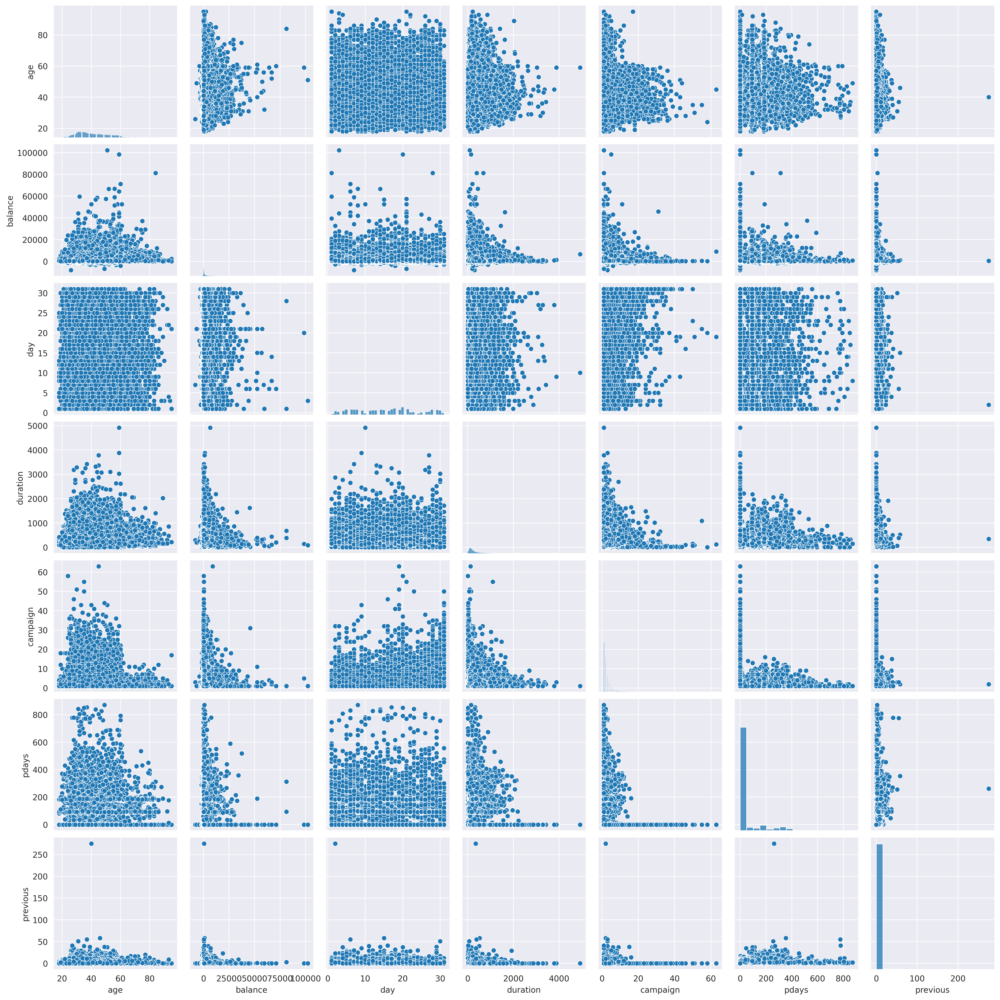

In [15]:
sns.pairplot(data=bk)


<Axes: >

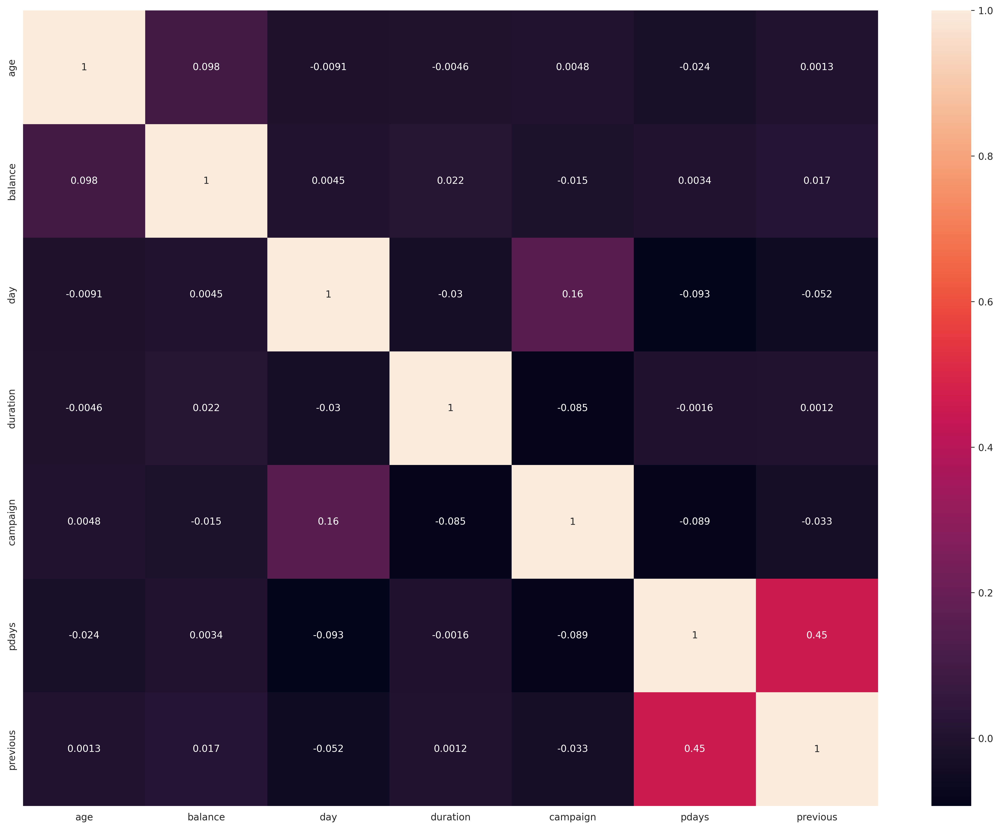

In [16]:
sns.heatmap(bk.corr(), annot=True)


### Converting Categorical Data to Numerical Data

#### Converting Job Data to Numerical Data

In [17]:
bk['job'].replace(['admin.', 'blue-collar', 'entrepreneur', 'housemaid', 'management', 'retired', 'self-employed', 'services', 'student', 'technician', 'unemployed', 'unknown'],
                  [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
                  inplace=True)

bk


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,4,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,9,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,2,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,1,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,11,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,9,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,5,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,5,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,1,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


#### Converting Marital Data to Numerical Data

In [18]:
bk['marital'].replace(['divorced', 'married', 'single'],
                      [0, 1, 2],
                      inplace=True)

bk


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,4,1,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,9,2,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,2,1,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,1,1,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,11,2,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,9,1,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,5,0,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,5,1,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,1,1,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


#### Converting Education Data to Numerical Data

In [19]:
bk['education'].replace(['primary', 'secondary', 'tertiary', 'unknown'],
                        [0, 1, 2, 3],
                        inplace=True)

bk


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,4,1,2,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,9,2,1,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,2,1,1,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,1,1,3,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,11,2,3,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,9,1,2,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,5,0,0,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,5,1,1,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,1,1,1,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


#### Converting Default Data to Numerical Data

In [20]:
bk['default'].replace(['no', 'yes'],
                      [0, 1],
                      inplace=True)

bk


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,4,1,2,0,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,9,2,1,0,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,2,1,1,0,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,1,1,3,0,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,11,2,3,0,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,9,1,2,0,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,5,0,0,0,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,5,1,1,0,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,1,1,1,0,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


#### Converting Housing Data to Numerical Data

In [21]:
bk['housing'].replace(['no', 'yes'],
                      [0, 1],
                      inplace=True)

bk


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,4,1,2,0,2143,1,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,9,2,1,0,29,1,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,2,1,1,0,2,1,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,1,1,3,0,1506,1,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,11,2,3,0,1,0,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,9,1,2,0,825,0,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,5,0,0,0,1729,0,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,5,1,1,0,5715,0,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,1,1,1,0,668,0,no,telephone,17,nov,508,4,-1,0,unknown,no


#### Converting Loan Data to Numerical Data

In [22]:
bk['loan'].replace(['no', 'yes'],
                   [0, 1],
                   inplace=True)

bk


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,4,1,2,0,2143,1,0,unknown,5,may,261,1,-1,0,unknown,no
1,44,9,2,1,0,29,1,0,unknown,5,may,151,1,-1,0,unknown,no
2,33,2,1,1,0,2,1,1,unknown,5,may,76,1,-1,0,unknown,no
3,47,1,1,3,0,1506,1,0,unknown,5,may,92,1,-1,0,unknown,no
4,33,11,2,3,0,1,0,0,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,9,1,2,0,825,0,0,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,5,0,0,0,1729,0,0,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,5,1,1,0,5715,0,0,cellular,17,nov,1127,5,184,3,success,yes
45209,57,1,1,1,0,668,0,0,telephone,17,nov,508,4,-1,0,unknown,no


#### Converting Contact Data to Numerical Data

In [23]:
bk['contact'].replace(['cellular','telephone','unknown'],
                    [0,1,2],
                    inplace =True)

bk

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,4,1,2,0,2143,1,0,2,5,may,261,1,-1,0,unknown,no
1,44,9,2,1,0,29,1,0,2,5,may,151,1,-1,0,unknown,no
2,33,2,1,1,0,2,1,1,2,5,may,76,1,-1,0,unknown,no
3,47,1,1,3,0,1506,1,0,2,5,may,92,1,-1,0,unknown,no
4,33,11,2,3,0,1,0,0,2,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,9,1,2,0,825,0,0,0,17,nov,977,3,-1,0,unknown,yes
45207,71,5,0,0,0,1729,0,0,0,17,nov,456,2,-1,0,unknown,yes
45208,72,5,1,1,0,5715,0,0,0,17,nov,1127,5,184,3,success,yes
45209,57,1,1,1,0,668,0,0,1,17,nov,508,4,-1,0,unknown,no


#### Converting Month Data to Numerical Data

In [24]:
bk['month'].replace(['apr','aug','dec','feb','jan','jul','jun','mar','may','nov','oct','sep'],
                    [4,8,12,2,1,7,6,3,5,11,10,9],
                    inplace =True)

bk

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,4,1,2,0,2143,1,0,2,5,5,261,1,-1,0,unknown,no
1,44,9,2,1,0,29,1,0,2,5,5,151,1,-1,0,unknown,no
2,33,2,1,1,0,2,1,1,2,5,5,76,1,-1,0,unknown,no
3,47,1,1,3,0,1506,1,0,2,5,5,92,1,-1,0,unknown,no
4,33,11,2,3,0,1,0,0,2,5,5,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,9,1,2,0,825,0,0,0,17,11,977,3,-1,0,unknown,yes
45207,71,5,0,0,0,1729,0,0,0,17,11,456,2,-1,0,unknown,yes
45208,72,5,1,1,0,5715,0,0,0,17,11,1127,5,184,3,success,yes
45209,57,1,1,1,0,668,0,0,1,17,11,508,4,-1,0,unknown,no


#### Converting Poutcome Data to Numerical Data

In [25]:
bk['poutcome'].replace(['failure','other','success','unknown'],
                    [0,2,1,3],
                    inplace =True)

bk

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,4,1,2,0,2143,1,0,2,5,5,261,1,-1,0,3,no
1,44,9,2,1,0,29,1,0,2,5,5,151,1,-1,0,3,no
2,33,2,1,1,0,2,1,1,2,5,5,76,1,-1,0,3,no
3,47,1,1,3,0,1506,1,0,2,5,5,92,1,-1,0,3,no
4,33,11,2,3,0,1,0,0,2,5,5,198,1,-1,0,3,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,9,1,2,0,825,0,0,0,17,11,977,3,-1,0,3,yes
45207,71,5,0,0,0,1729,0,0,0,17,11,456,2,-1,0,3,yes
45208,72,5,1,1,0,5715,0,0,0,17,11,1127,5,184,3,1,yes
45209,57,1,1,1,0,668,0,0,1,17,11,508,4,-1,0,3,no


#### Converting Y Data to Numerical Data

In [26]:
bk['y'].replace(['no','yes'],
                    [0,1],
                    inplace =True)

bk

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,4,1,2,0,2143,1,0,2,5,5,261,1,-1,0,3,0
1,44,9,2,1,0,29,1,0,2,5,5,151,1,-1,0,3,0
2,33,2,1,1,0,2,1,1,2,5,5,76,1,-1,0,3,0
3,47,1,1,3,0,1506,1,0,2,5,5,92,1,-1,0,3,0
4,33,11,2,3,0,1,0,0,2,5,5,198,1,-1,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,9,1,2,0,825,0,0,0,17,11,977,3,-1,0,3,1
45207,71,5,0,0,0,1729,0,0,0,17,11,456,2,-1,0,3,1
45208,72,5,1,1,0,5715,0,0,0,17,11,1127,5,184,3,1,1
45209,57,1,1,1,0,668,0,0,1,17,11,508,4,-1,0,3,0


### Outlier Detection

In [27]:
def outlier_percentage(df):
    for i in range(len(df.columns)):

        q1 = df[df.columns[i]].quantile(0.25)
        q3 = df[df.columns[i]].quantile(0.75)
        iqr = q3-q1

        upper = q3 + (iqr*1.5)
        lower = q1 - (iqr*1.5)

        percentage = (((len(df[df[df.columns[i]] > upper])) +
                      (len(df[df[df.columns[i]] < lower])))/len(df[df.columns[i]]))*100

        print(str(df.columns[i]) + ' : ' + str(percentage) + ' %')


In [28]:
def replace_outlier_extream(st, col):

    q1 = st[col].quantile(0.25)
    q3 = st[col].quantile(0.75)
    iqr = q3-q1

    upper = q3 + (iqr*1.5)
    lower = q1 - (iqr*1.5)

    st[col].mask(st[col] > upper, upper, inplace=True)
    st[col].mask(st[col] < lower, lower, inplace=True)


In [29]:
def remove_outlier(st, col):
    q1 = st[col].quantile(0.25)
    q3 = st[col].quantile(0.75)
    iqr = q3-q1

    upper = q3 + (iqr*1.5)
    lower = q1 - (iqr*1.5)

    st = st[(st[col] > lower) & (st[col] < upper)]

    return st


#### Outlier Percentage (Before)

In [30]:
outlier_percentage(bk)


age : 1.0771714848156422 %
job : 0.0 %
marital : 0.0 %
education : 0.0 %
default : 1.8026586450200173 %
balance : 10.459843843312468 %
housing : 0.0 %
loan : 16.022649355245406 %
contact : 0.0 %
day : 0.0 %
month : 0.0 %
duration : 7.155338302625467 %
campaign : 6.7771117648359915 %
pdays : 18.263254517705867 %
previous : 18.263254517705867 %
poutcome : 18.252195262214947 %
y : 11.698480458295547 %


- We will not be removing outlier in categorical columns and also from campaign, pdays & previous, because this columns cant be properly evaluated.

#### Removing Outlier In Age Column

In [31]:
pe.box(bk['age'], orientation='h')


In [32]:
bk = remove_outlier(bk, 'age')

In [33]:
pe.box(bk['age'], orientation='h')


In [34]:
lost_record()

We lost 1.08 % data


#### Replacing Outlier In Balance Column

In [35]:
pe.box(bk['balance'], orientation='h')


In [36]:
replace_outlier_extream(bk, 'balance')


In [37]:
pe.box(bk['balance'], orientation='h')


#### Replacing Outlier In Duration Column

In [38]:
pe.box(bk['duration'], orientation='h')


In [39]:
replace_outlier_extream(bk, 'duration')


In [40]:
pe.box(bk['duration'], orientation='h')


In [41]:
lost_record()

We lost 1.08 % data


#### Outlier Percentage (After)

In [42]:
outlier_percentage(bk)


age : 0.0 %
job : 0.0 %
marital : 0.0 %
education : 0.0 %
default : 1.820051873714337 %
balance : 0.0 %
housing : 0.0 %
loan : 16.19041230659154 %
contact : 0.0 %
day : 0.0 %
month : 0.0 %
duration : 0.0 %
campaign : 6.819604686521778 %
pdays : 18.05741883552455 %
previous : 18.05741883552455 %
poutcome : 18.04623915571058 %
y : 11.338431267328504 %


#### Reindexing Columns

In [43]:
bk

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,4,1,2,0,2143.0,1,0,2,5,5,261.0,1,-1,0,3,0
1,44,9,2,1,0,29.0,1,0,2,5,5,151.0,1,-1,0,3,0
2,33,2,1,1,0,2.0,1,1,2,5,5,76.0,1,-1,0,3,0
3,47,1,1,3,0,1506.0,1,0,2,5,5,92.0,1,-1,0,3,0
4,33,11,2,3,0,1.0,0,0,2,5,5,198.0,1,-1,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45203,23,8,2,2,0,113.0,0,0,0,17,11,266.0,1,-1,0,3,1
45205,25,9,2,1,0,505.0,0,1,0,17,11,386.0,2,-1,0,3,1
45206,51,9,1,2,0,825.0,0,0,0,17,11,640.5,3,-1,0,3,1
45209,57,1,1,1,0,668.0,0,0,1,17,11,508.0,4,-1,0,3,0


In [44]:
bk.reset_index(inplace=True)
bk.drop(columns='index', inplace=True)

bk


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,4,1,2,0,2143.0,1,0,2,5,5,261.0,1,-1,0,3,0
1,44,9,2,1,0,29.0,1,0,2,5,5,151.0,1,-1,0,3,0
2,33,2,1,1,0,2.0,1,1,2,5,5,76.0,1,-1,0,3,0
3,47,1,1,3,0,1506.0,1,0,2,5,5,92.0,1,-1,0,3,0
4,33,11,2,3,0,1.0,0,0,2,5,5,198.0,1,-1,0,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44719,23,8,2,2,0,113.0,0,0,0,17,11,266.0,1,-1,0,3,1
44720,25,9,2,1,0,505.0,0,1,0,17,11,386.0,2,-1,0,3,1
44721,51,9,1,2,0,825.0,0,0,0,17,11,640.5,3,-1,0,3,1
44722,57,1,1,1,0,668.0,0,0,1,17,11,508.0,4,-1,0,3,0


## Splitting The Data Into Target and Independent set

In [45]:
x = bk.iloc[:,:-1]
y = bk['y']

In [46]:
x

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,58,4,1,2,0,2143.0,1,0,2,5,5,261.0,1,-1,0,3
1,44,9,2,1,0,29.0,1,0,2,5,5,151.0,1,-1,0,3
2,33,2,1,1,0,2.0,1,1,2,5,5,76.0,1,-1,0,3
3,47,1,1,3,0,1506.0,1,0,2,5,5,92.0,1,-1,0,3
4,33,11,2,3,0,1.0,0,0,2,5,5,198.0,1,-1,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44719,23,8,2,2,0,113.0,0,0,0,17,11,266.0,1,-1,0,3
44720,25,9,2,1,0,505.0,0,1,0,17,11,386.0,2,-1,0,3
44721,51,9,1,2,0,825.0,0,0,0,17,11,640.5,3,-1,0,3
44722,57,1,1,1,0,668.0,0,0,1,17,11,508.0,4,-1,0,3


### Normalizing The Dataset

In [47]:
sc = StandardScaler()
scaled_x  = pd.DataFrame(sc.fit_transform(x), columns=x.columns)

In [48]:
scaled_x

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
0,1.749275,-0.101271,-0.282226,1.037933,-0.136154,1.052205,0.883491,-0.439524,1.506768,-1.298868,-0.475305,0.153057,-0.569618,-0.409212,-0.249240,0.438074
1,0.346205,1.419428,1.361301,-0.306342,-0.136154,-0.767489,0.883491,-0.439524,1.506768,-1.298868,-0.475305,-0.471302,-0.569618,-0.409212,-0.249240,0.438074
2,-0.756207,-0.709551,-0.282226,-0.306342,-0.136154,-0.790730,0.883491,2.275191,1.506768,-1.298868,-0.475305,-0.897001,-0.569618,-0.409212,-0.249240,0.438074
3,0.646863,-1.013691,-0.282226,2.382208,-0.136154,0.503887,0.883491,-0.439524,1.506768,-1.298868,-0.475305,-0.806186,-0.569618,-0.409212,-0.249240,0.438074
4,-0.756207,2.027708,1.361301,2.382208,-0.136154,-0.791591,-1.131874,-0.439524,1.506768,-1.298868,-0.475305,-0.204530,-0.569618,-0.409212,-0.249240,0.438074
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44719,-1.758400,1.115288,1.361301,1.037933,-0.136154,-0.695183,-1.131874,-0.439524,-0.712703,0.142621,2.028329,0.181437,-0.569618,-0.409212,-0.249240,0.438074
44720,-1.557961,1.419428,1.361301,-0.306342,-0.136154,-0.357756,-1.131874,2.275191,-0.712703,0.142621,2.028329,0.862557,-0.247924,-0.409212,-0.249240,0.438074
44721,1.047740,1.419428,-0.282226,1.037933,-0.136154,-0.082306,-1.131874,-0.439524,-0.712703,0.142621,2.028329,2.307097,0.073770,-0.409212,-0.249240,0.438074
44722,1.649056,-1.013691,-0.282226,-0.306342,-0.136154,-0.217449,-1.131874,-0.439524,0.397033,0.142621,2.028329,1.555028,0.395464,-0.409212,-0.249240,0.438074


### Splitting The Data Into Training And Testing Set

In [49]:
xtrain,xtest,ytrain,ytest = train_test_split(scaled_x,y,train_size=0.75,random_state=1)

In [50]:
xtrain

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome
32127,-0.956645,-0.101271,1.361301,1.037933,-0.136154,-0.792451,0.883491,-0.439524,-0.712703,-0.097627,-0.892577,-0.278318,-0.247924,-0.409212,-0.249240,0.438074
30563,1.348398,0.507009,-0.282226,1.037933,-0.136154,-0.325907,-1.131874,-0.439524,0.397033,-1.178744,-1.727122,-1.055929,0.717158,-0.409212,-0.249240,0.438074
15367,1.047740,-0.709551,-1.925754,1.037933,-0.136154,-0.772653,0.883491,-0.439524,-0.712703,0.262745,0.359240,-0.323726,0.073770,-0.409212,-0.249240,0.438074
41965,-0.555768,-0.101271,-0.282226,1.037933,-0.136154,-0.792451,0.883491,-0.439524,-0.712703,-0.578123,2.028329,-0.028574,-0.247924,0.558924,1.054706,-1.605678
3271,0.546644,0.811148,-0.282226,-0.306342,-0.136154,-0.342262,-1.131874,-0.439524,1.506768,-0.097627,-0.475305,1.532324,0.073770,-0.409212,-0.249240,0.438074
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43723,2.450810,0.202869,-1.925754,-0.306342,-0.136154,-0.079724,-1.131874,-0.439524,-0.712703,-0.337875,0.359240,0.402801,-0.569618,-0.409212,-0.249240,0.438074
32511,-1.157084,-1.013691,1.361301,-0.306342,-0.136154,-0.129649,0.883491,-0.439524,-0.712703,0.142621,-0.892577,0.607137,-0.569618,-0.409212,-0.249240,0.438074
5192,0.747082,-0.101271,-0.282226,1.037933,-0.136154,2.145829,-1.131874,-0.439524,1.506768,0.623117,-0.475305,0.732009,1.038852,-0.409212,-0.249240,0.438074
12172,0.446424,-1.317830,-0.282226,2.382208,-0.136154,0.742323,-1.131874,-0.439524,1.506768,0.502993,-0.058032,-1.265941,2.647322,-0.409212,-0.249240,0.438074


## Preparing Model From The Dataset

### Creating Model With Normalized Data

In [51]:
lg = LogisticRegression()

#### Training The Model

In [52]:
lg.fit(xtrain,ytrain)

LogisticRegression()

#### Predicting The Data Using Testing Data

In [53]:
ypred = lg.predict(xtest)

In [54]:
ypred[:21]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

## Evaluating The Model

### Creating Classification Report

In [55]:
print('Actual Y: ', ytest[:25].values)
print('Predict Y:', ypred[:25])

Actual Y:  [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]
Predict Y: [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


In [56]:
print(classification_report(ytest,ypred))

              precision    recall  f1-score   support

           0       0.91      0.97      0.94      9939
           1       0.53      0.24      0.33      1242

    accuracy                           0.89     11181
   macro avg       0.72      0.61      0.63     11181
weighted avg       0.87      0.89      0.87     11181



- We have accuracy of 89% which is fine but are recall value is very low we need to incress it, as per are problem statement.

### Prepairing Confusion Matrix

In [57]:
confusion_matrix(ytest,ypred)

array([[9684,  255],
       [ 949,  293]])

Text(773.5277777777777, 0.5, 'Predicted Values')

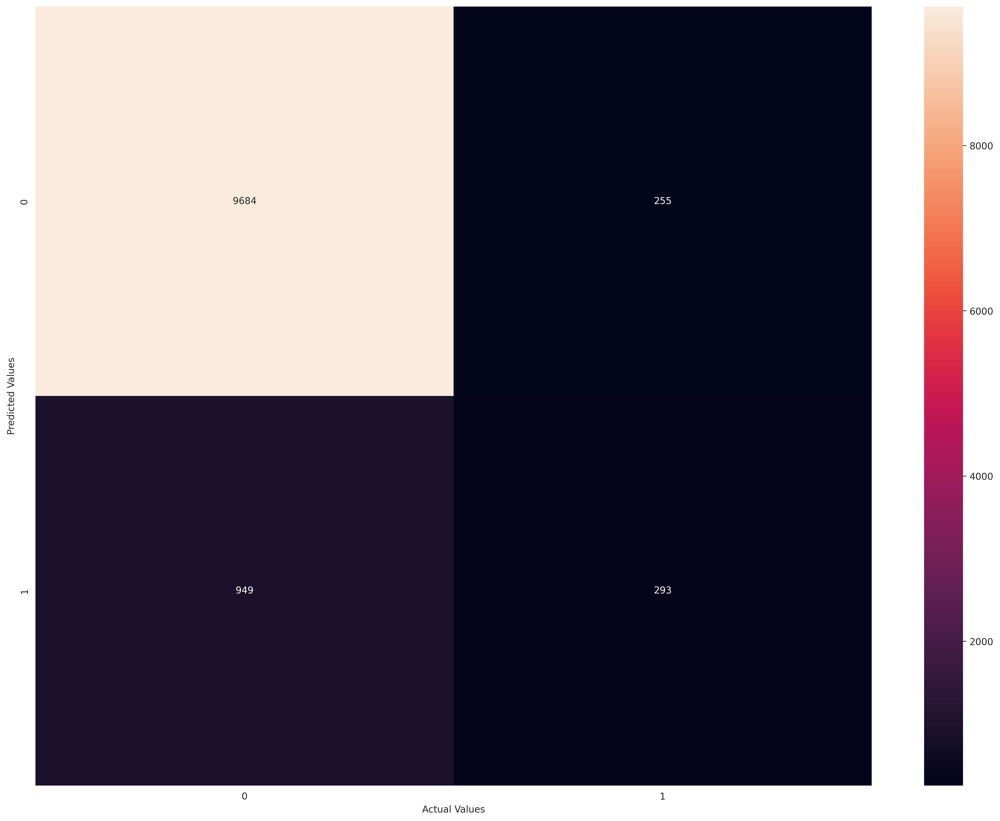

In [58]:
sns.heatmap(confusion_matrix(ytest,ypred), annot = True, fmt='.4g')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')

## Performing Threshold Selection

### Shorting All Probability For Threshold Selection

In [59]:
lg.predict_proba(xtest)

array([[0.99849371, 0.00150629],
       [0.99389419, 0.00610581],
       [0.98079999, 0.01920001],
       ...,
       [0.98464667, 0.01535333],
       [0.99345848, 0.00654152],
       [0.99183005, 0.00816995]])

In [60]:
proba = lg.predict_proba(xtest)[:,1]

proba

array([0.00150629, 0.00610581, 0.01920001, ..., 0.01535333, 0.00654152,
       0.00816995])

### Ploting Roc Curve

In [61]:
auc = roc_auc_score(ytest,proba)

auc

0.878691661648131

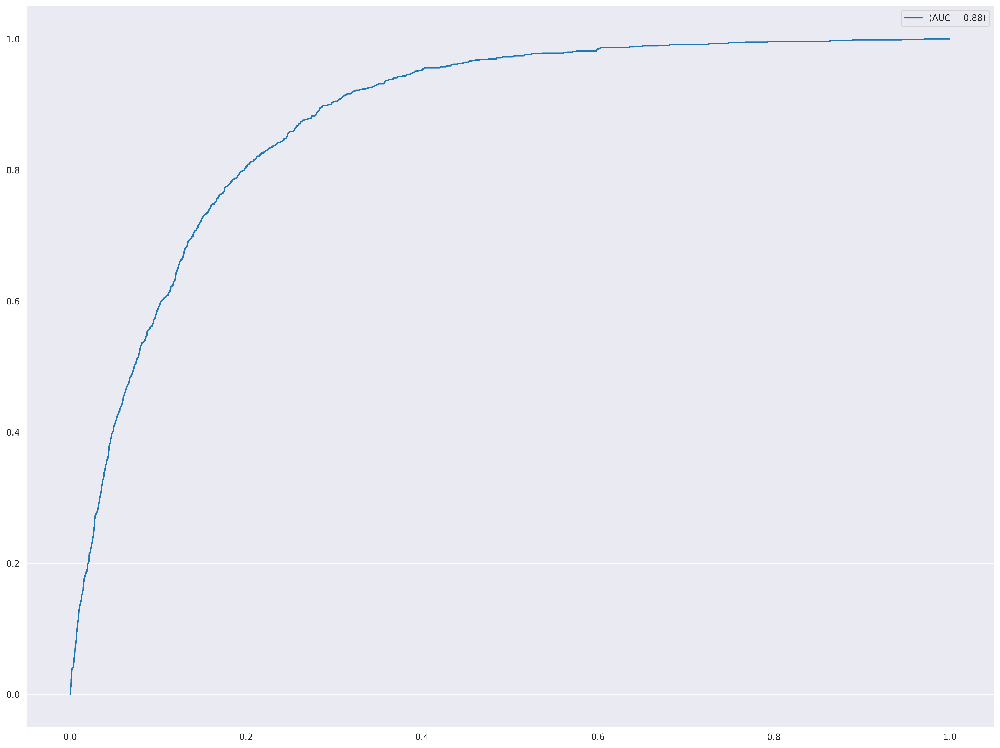

In [62]:
fpr,tpr, threshold = roc_curve(ytest,proba)

plt.plot(fpr,tpr,label = '(AUC = %0.2f)'%auc)
plt.legend()

### Selecting Optimal Threshold Value

In [63]:
def Optimal_Threshold(proba,ytest,ypred):
    accuracy = []

    for i in threshold:
        ypred = np.where(proba>i,1,0)
        accuracy.append(accuracy_score(ytest,ypred))

        final_threshold = pd.concat([pd.Series(threshold),pd.Series(accuracy)], axis=1)
        final_threshold.columns = ['Threshold','Accuracy']

        threshold_value = final_threshold.sort_values(by='Accuracy', ascending=False).iloc[0,0]

    return threshold_value,final_threshold.sort_values(by='Accuracy', ascending=False)

In [64]:
Optimal_Threshold(proba,ytest,ypred)

(0.5878732028713228,
       Threshold  Accuracy
 191    0.587873  0.894374
 192    0.587357  0.894285
 190    0.588657  0.894285
 133    0.649626  0.894285
 186    0.594611  0.894285
 ...         ...       ...
 1667   0.005139  0.159467
 1668   0.005122  0.159378
 1669   0.003800  0.136839
 1670   0.003786  0.136750
 1671   0.000054  0.111171
 
 [1672 rows x 2 columns])

### Fiting Optimal Threshold In The Model

In [65]:
new_ypred = binarize([proba], threshold = Optimal_Threshold(proba,ytest,ypred)[0])[0]

new_ypred

array([0., 0., 0., ..., 0., 0., 0.])

- we have created new predection with are new threshold.

## Preparing Classification Report With New Threshold

In [66]:
print(classification_report(ytest,new_ypred))

              precision    recall  f1-score   support

           0       0.91      0.98      0.94      9939
           1       0.58      0.18      0.27      1242

    accuracy                           0.89     11181
   macro avg       0.74      0.58      0.61     11181
weighted avg       0.87      0.89      0.87     11181

